NIM : 2702321415

Nama : Daniel

Kelas : LC09

In [1]:
import datetime
print(f"Notebook last run (end-to-end): {datetime.datetime.now()}")

Notebook last run (end-to-end): 2025-04-16 11:28:43.243611


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import zipfile
import io
from IPython.display import display
from collections import defaultdict
import os
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications import DenseNet121
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

from warnings import filterwarnings
filterwarnings('ignore')

### Nomor 2A

Jumlah gambar Training: 5712
Jumlah gambar Testing : 1311

Contoh gambar Training:
  - Training/glioma/Tr-gl_0010.jpg


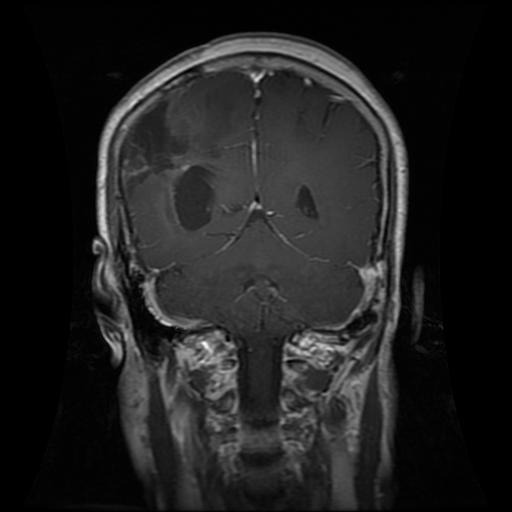

  - Training/glioma/Tr-gl_0011.jpg


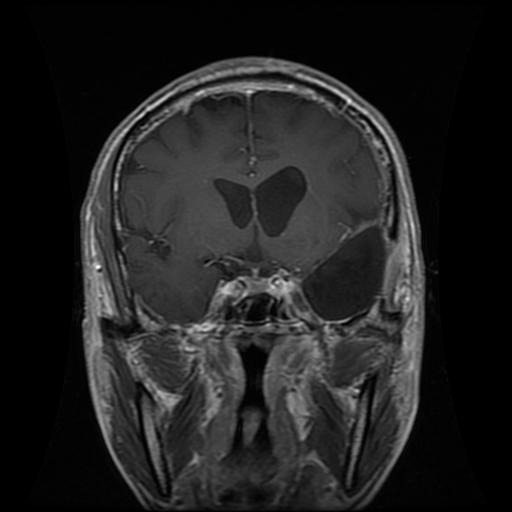

  - Training/glioma/Tr-gl_0012.jpg


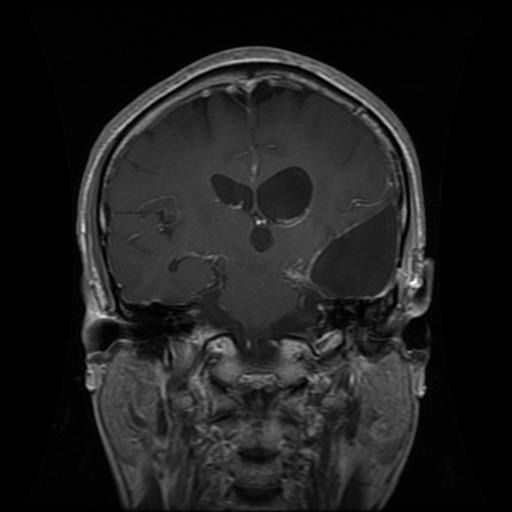

Contoh gambar Testing:
  - Testing/glioma/Te-gl_0010.jpg


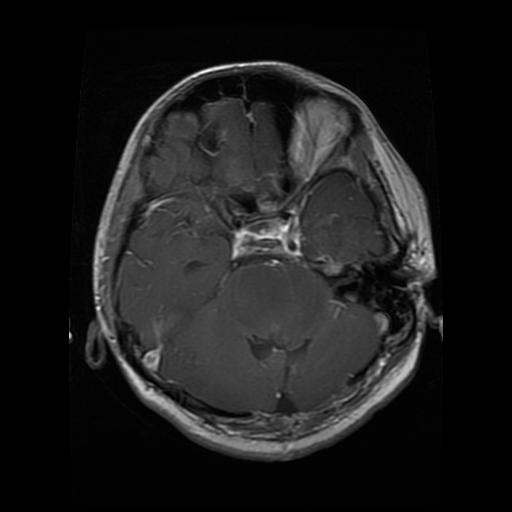

  - Testing/glioma/Te-gl_0011.jpg


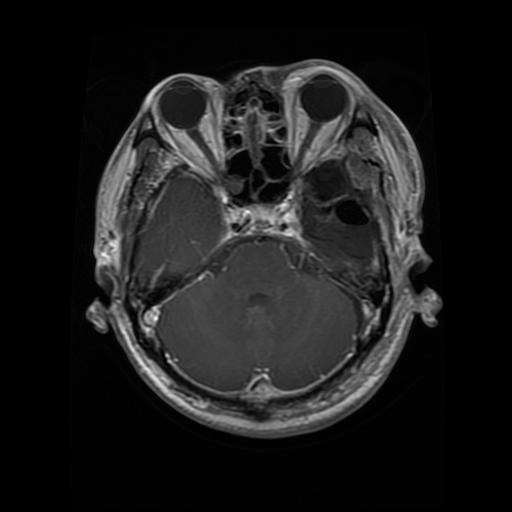

  - Testing/glioma/Te-gl_0012.jpg


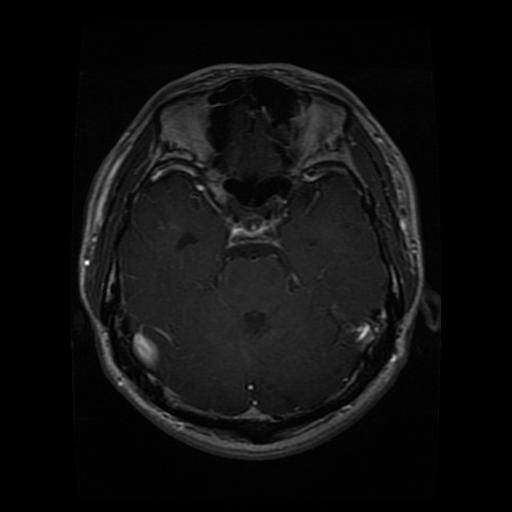

In [3]:
zip_path = r"C:\Users\idan0\Downloads\02-20250409T170740Z-001\02\Dataset 2A.zip"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    all_files = zip_ref.namelist()

    training_images = [f for f in all_files if f.startswith('Training/') and f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    testing_images  = [f for f in all_files if f.startswith('Testing/') and f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    print(f"Jumlah gambar Training: {len(training_images)}")
    print(f"Jumlah gambar Testing : {len(testing_images)}\n")

    print("Contoh gambar Training:")
    for i, file_name in enumerate(training_images[:3]):
        print(f"  - {file_name}")
        with zip_ref.open(file_name) as file:
            img = Image.open(io.BytesIO(file.read()))
            display(img)

    print("Contoh gambar Testing:")
    for i, file_name in enumerate(testing_images[:3]):
        print(f"  - {file_name}")
        with zip_ref.open(file_name) as file:
            img = Image.open(io.BytesIO(file.read()))
            display(img)


Pertama, saya membuka file zip dari path zip itu berada, kemudian disimpan di all_files.
Lalu memisahkan gambar testing dan training dan ekstensi file gambar seperti (.jpg, .jpeg, .png)

In [4]:
training_by_class = defaultdict(list)
testing_by_class = defaultdict(list)

for f in training_images:
    label = f.split('/')[1]
    training_by_class[label].append(f)

for f in testing_images:
    label = f.split('/')[1]
    testing_by_class[label].append(f)

print("Jumlah kategori di Training:", len(training_by_class))
for label, imgs in training_by_class.items():
    print(f"  - {label}: {len(imgs)} gambar")
    
print("Jumlah kategori di Testing:", len(testing_by_class))
for label, imgs in testing_by_class.items():
    print(f"  - {label}: {len(imgs)} gambar")


Jumlah kategori di Training: 4
  - glioma: 1321 gambar
  - meningioma: 1339 gambar
  - notumor: 1595 gambar
  - pituitary: 1457 gambar
Jumlah kategori di Testing: 4
  - glioma: 300 gambar
  - meningioma: 306 gambar
  - notumor: 405 gambar
  - pituitary: 300 gambar


Membuat dictionary dengan default value berupa list untuk menyimpan file gambar per label. lalu mengambil label dari path dan dikelompokkan. Kemudian menampilkan jumlah gambar per kategori.

In [6]:
def plot_combined_histogram(combined_hist, title='Histogram Warna Gabungan'):
    colors = ('r', 'g', 'b')
    for i, color in enumerate(colors):
        plt.plot(combined_hist[i], color=color)
    plt.title(title)
    plt.xlabel('Intensitas Warna')
    plt.ylabel('Jumlah Piksel')
    plt.show()


def process_and_plot_histogram(zip_path, data_dict, num_categories=4):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        for label, files in list(data_dict.items())[:num_categories]:
            combined_hist = np.zeros((3, 256))

            for file_name in files:
                with zip_ref.open(file_name) as file:
                    img = Image.open(io.BytesIO(file.read())).convert('RGB')
                    img_array = np.array(img)
                    for i in range(3):  # R, G, B
                        hist, _ = np.histogram(img_array[:, :, i], bins=256, range=(0, 256))
                        combined_hist[i] += hist

            plot_combined_histogram(combined_hist, f"Histogram Gabungan - {label}")


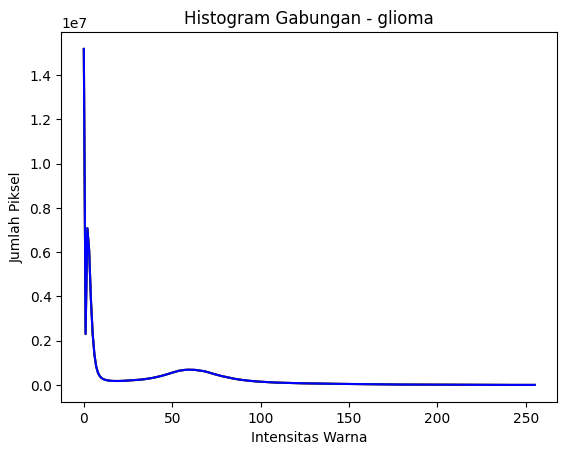

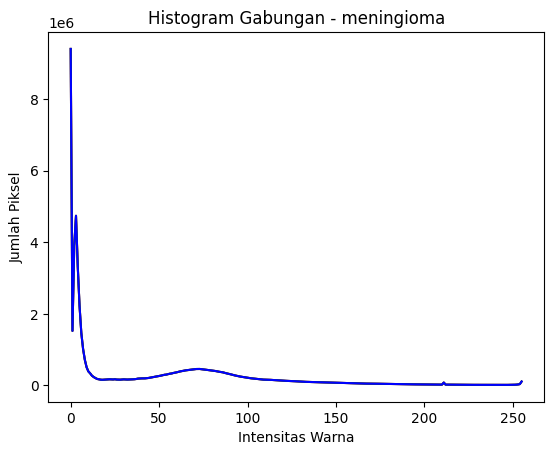

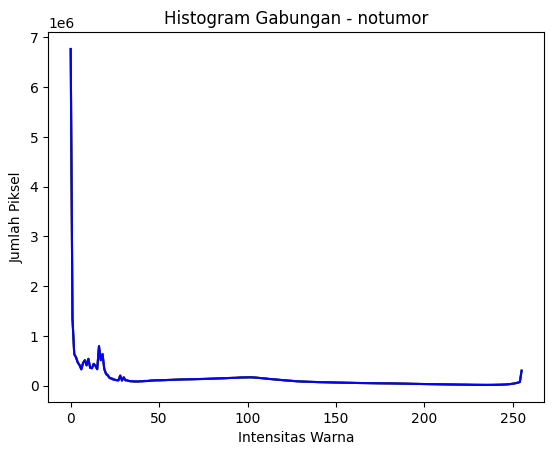

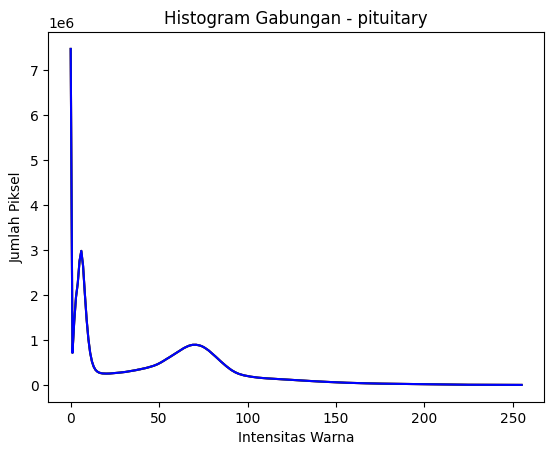

In [7]:
process_and_plot_histogram(zip_path, testing_by_class)


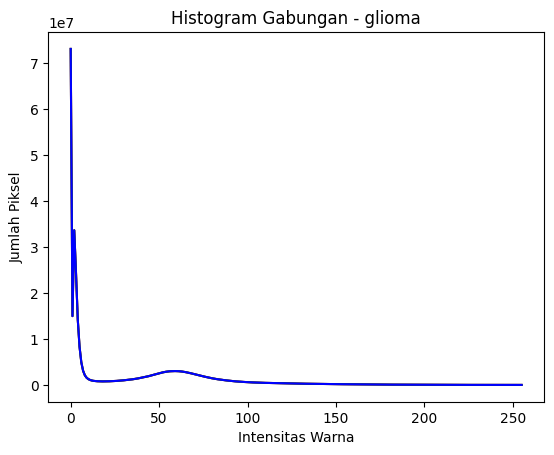

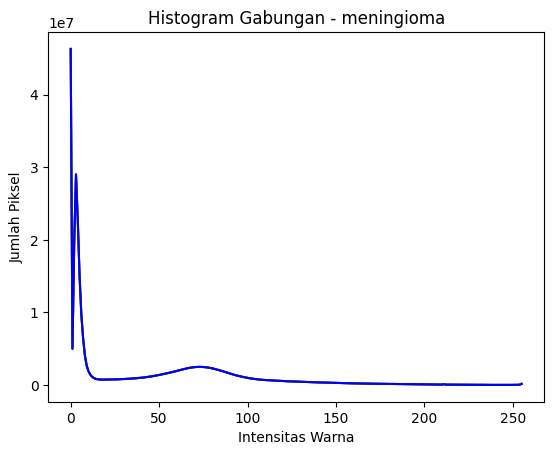

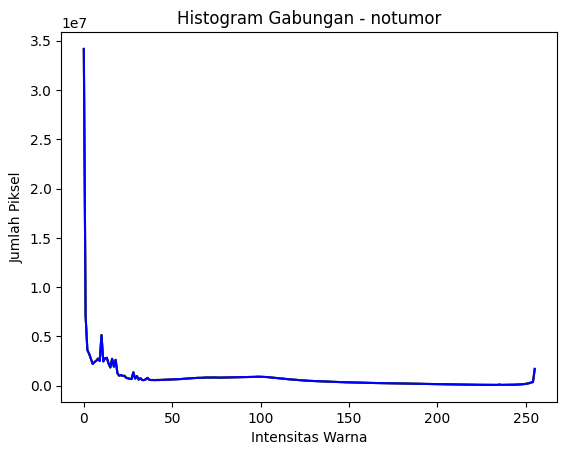

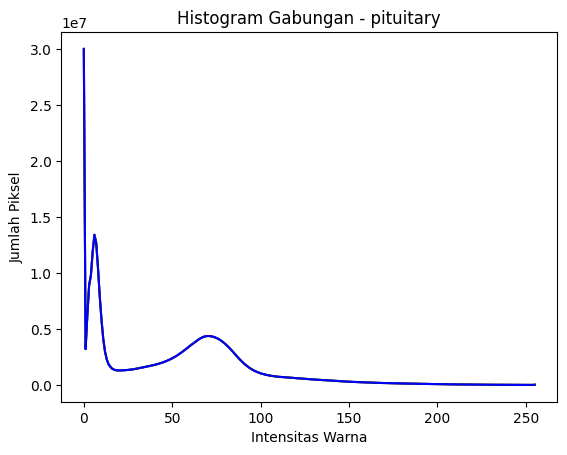

In [8]:
process_and_plot_histogram(zip_path, training_by_class)

Kalau lihat dari dataset imagenya sendiri, gambarnya hanya berwarna abu-abu (hitam putih), yang seharusnya grayscale.
Jadi untuk RGB pun isinya akan sama semya atau sangat mirip.

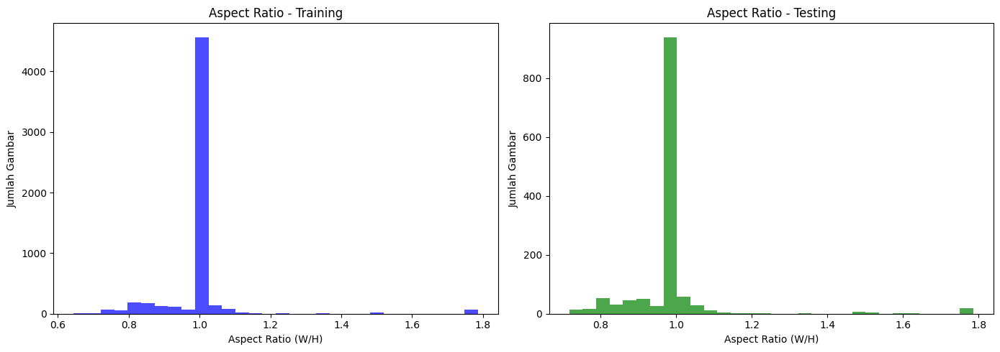

[TRAINING] Jumlah resolusi unik: 382
[TESTING] Jumlah resolusi unik: 194


In [9]:
aspect_ratios_train = []
resolutions_train = []

aspect_ratios_test = []
resolutions_test = []

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    for file_name in training_images:
        with zip_ref.open(file_name) as file:
            img = Image.open(io.BytesIO(file.read()))
            width, height = img.size
            aspect_ratios_train.append(width / height)
            resolutions_train.append((width, height))

    for file_name in testing_images:
        with zip_ref.open(file_name) as file:
            img = Image.open(io.BytesIO(file.read()))
            width, height = img.size
            aspect_ratios_test.append(width / height)
            resolutions_test.append((width, height))

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.hist(aspect_ratios_train, bins=30, color='blue', alpha=0.7)
plt.title('Aspect Ratio - Training')
plt.xlabel('Aspect Ratio (W/H)')
plt.ylabel('Jumlah Gambar')

plt.subplot(1, 2, 2)
plt.hist(aspect_ratios_test, bins=30, color='green', alpha=0.7)
plt.title('Aspect Ratio - Testing')
plt.xlabel('Aspect Ratio (W/H)')
plt.ylabel('Jumlah Gambar')

plt.tight_layout()
plt.show()

unique_res_train = set(resolutions_train)
unique_res_test = set(resolutions_test)

print(f"[TRAINING] Jumlah resolusi unik: {len(unique_res_train)}")
print(f"[TESTING] Jumlah resolusi unik: {len(unique_res_test)}")



Pada dataset training , memiliki resolusi unik yang lebih banyak daripada testing yang menandakan ukuran yang bervariasi.
ini dapat mempengaruhi konsistensi input model sehingga solusinya bisa di resize sama rata.

Contoh variasi visual dari masing-masing kategori pada Training Dataset:

Kategori: glioma


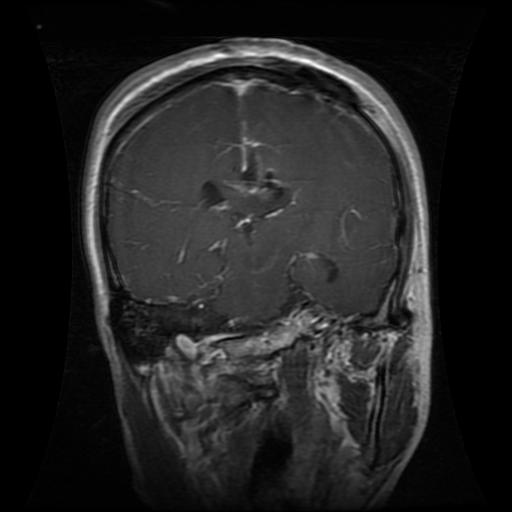

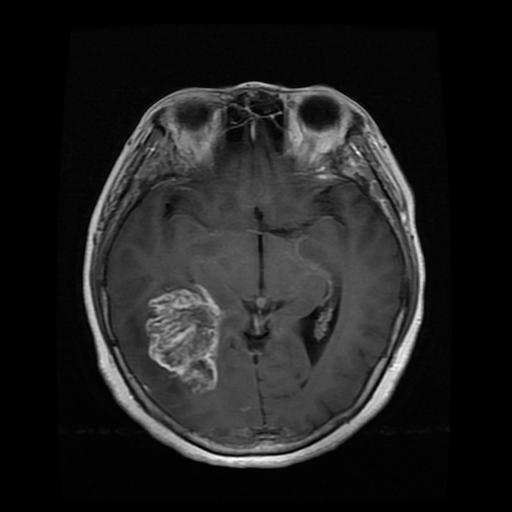

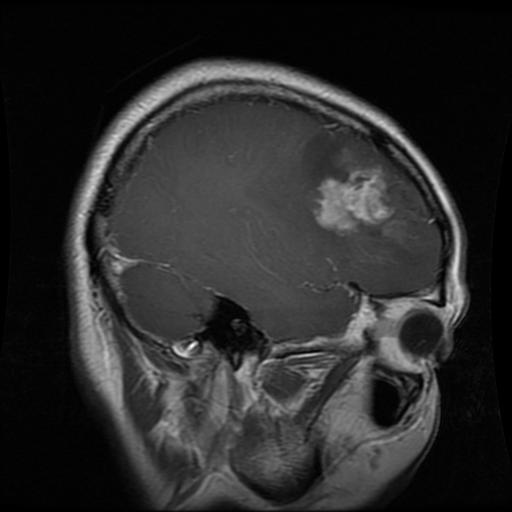

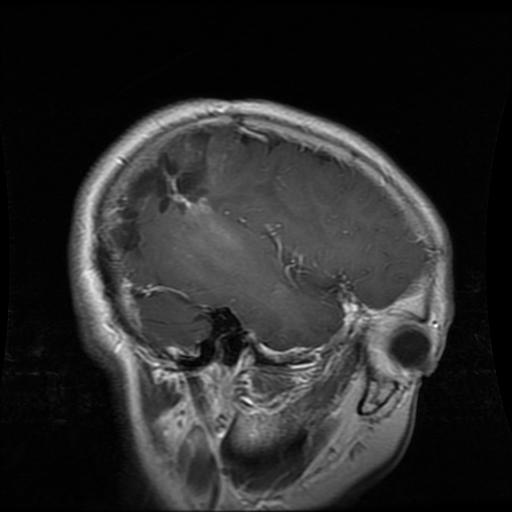

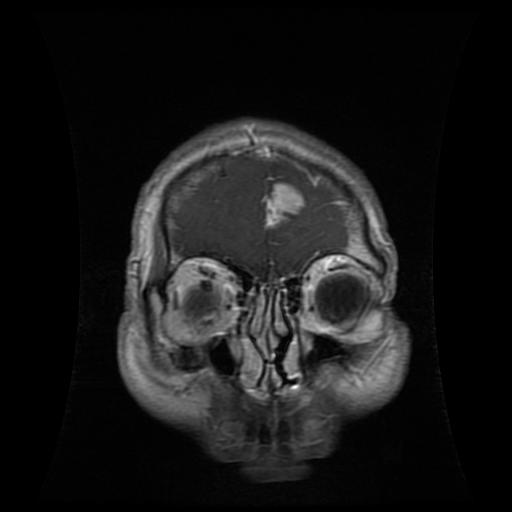


Kategori: meningioma


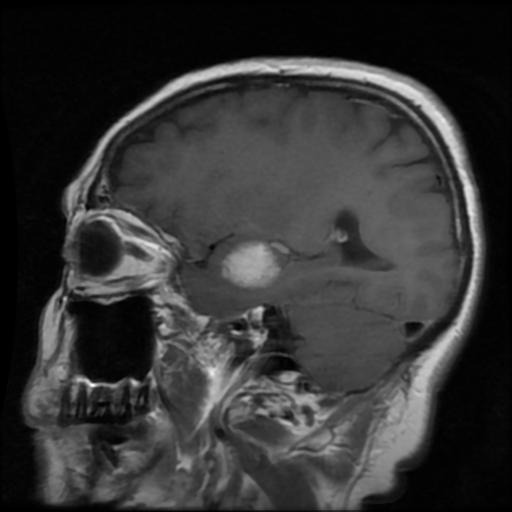

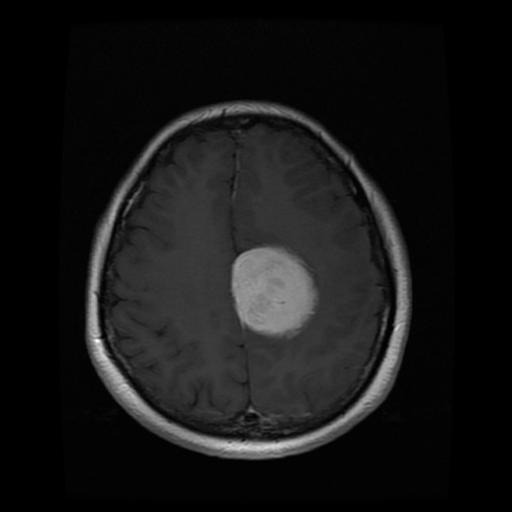

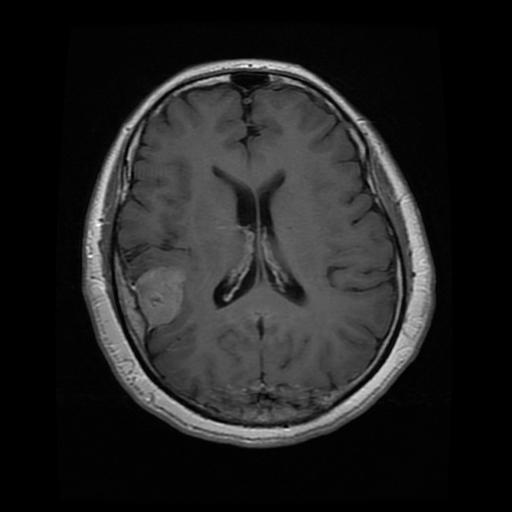

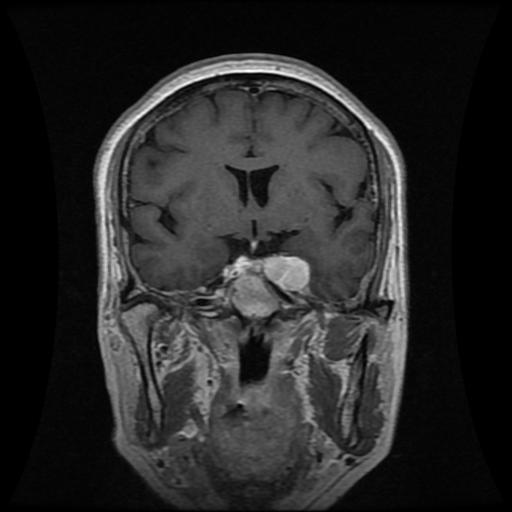

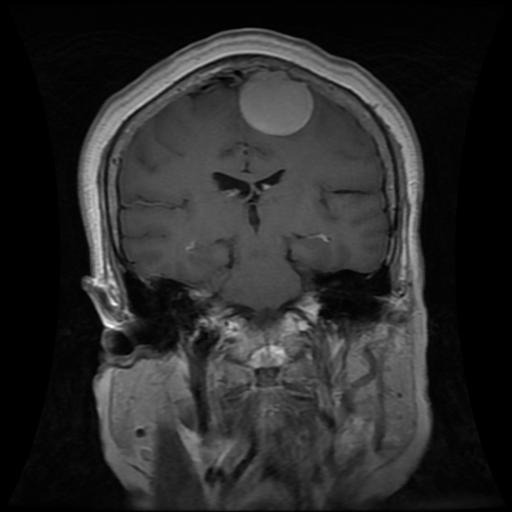


Kategori: notumor


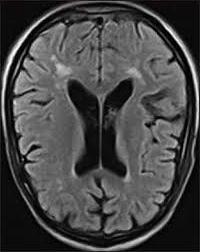

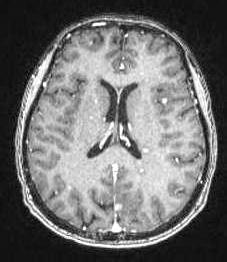

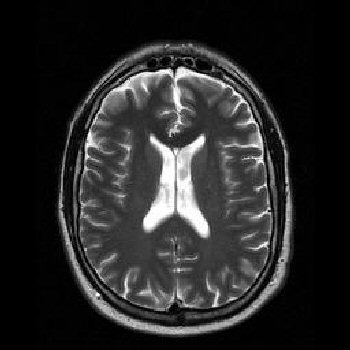

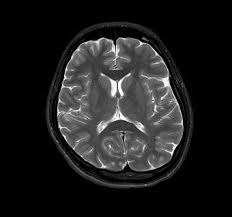

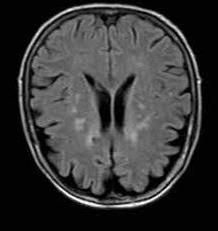


Kategori: pituitary


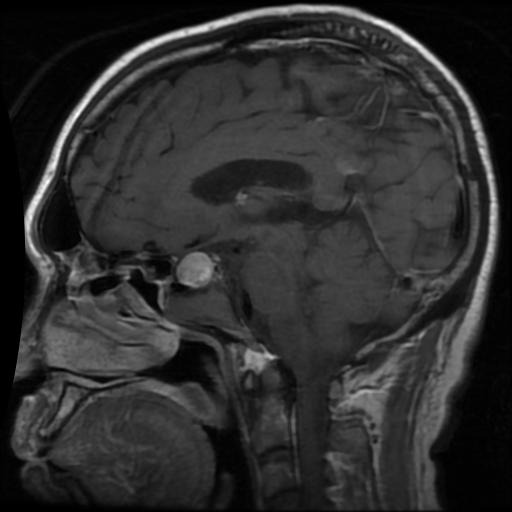

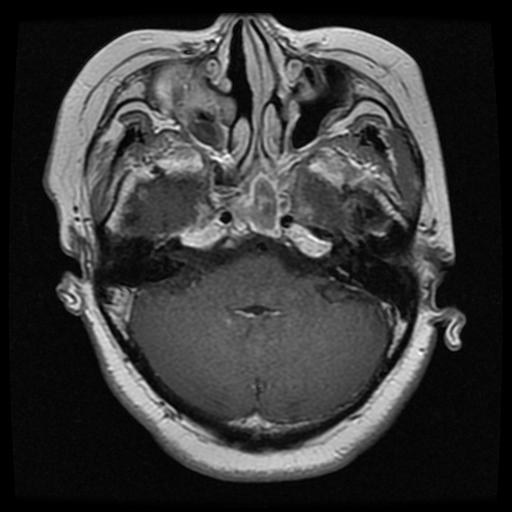

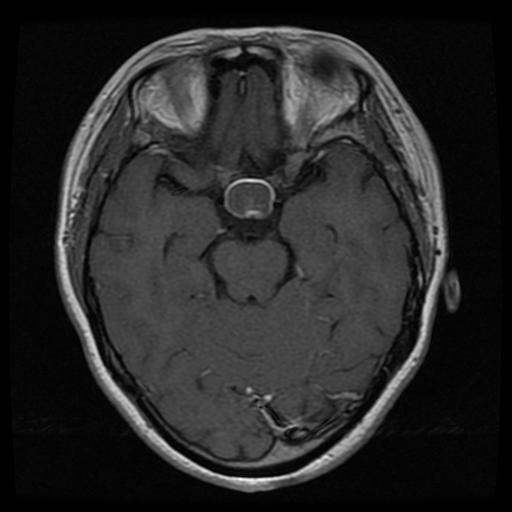

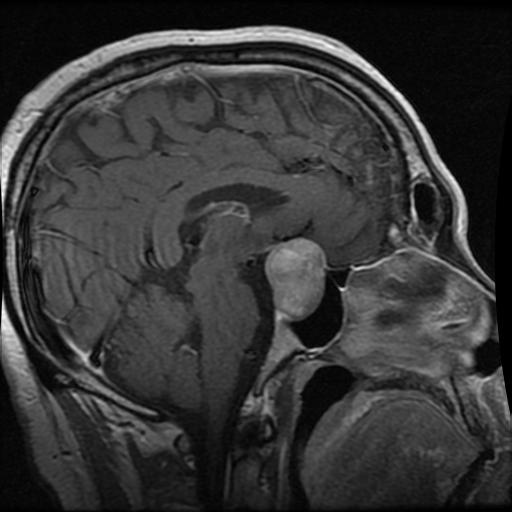

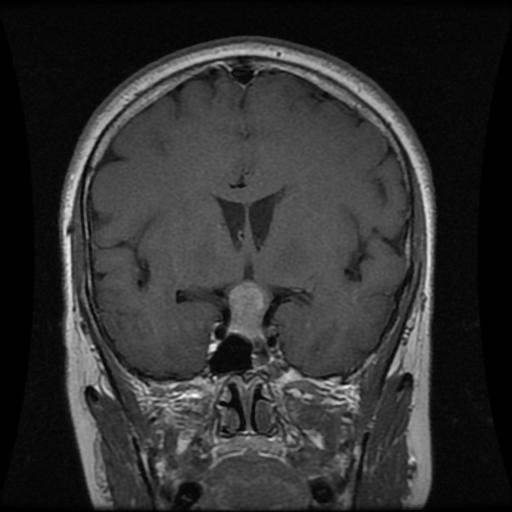

In [10]:
print("Contoh variasi visual dari masing-masing kategori pada Training Dataset:")

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    for label in list(training_by_class.keys())[:4]:  
        print(f"\nKategori: {label}")
        samples = random.sample(training_by_class[label], 5) 

        for file_name in samples:
            with zip_ref.open(file_name) as file:
                img = Image.open(io.BytesIO(file.read()))
                display(img)

Contoh variasi visual dari masing-masing kategori pada Testing Dataset:

Kategori: glioma


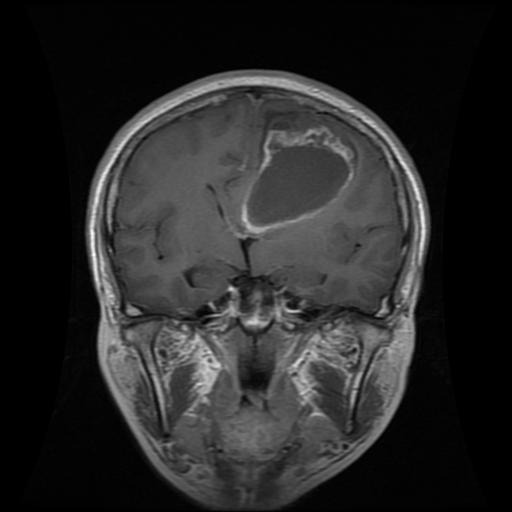

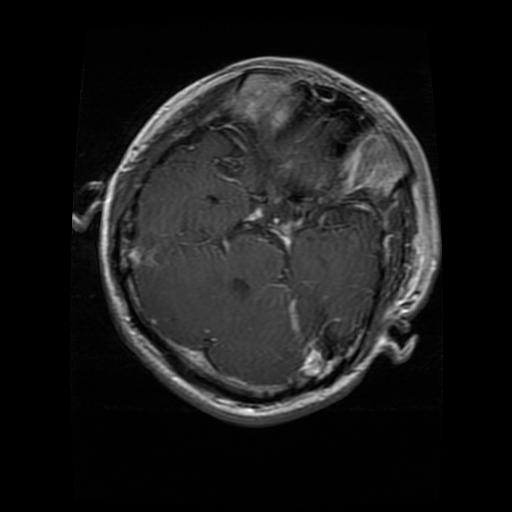

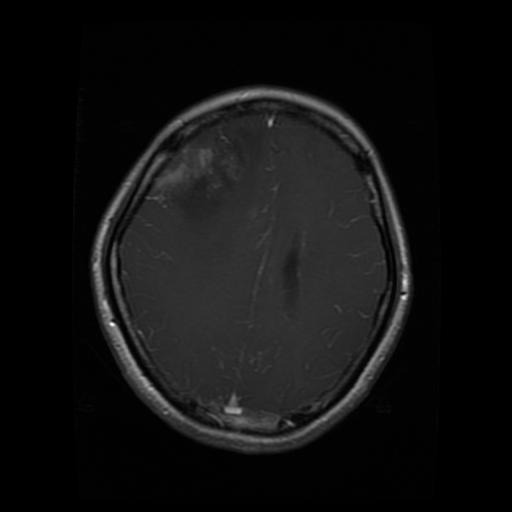

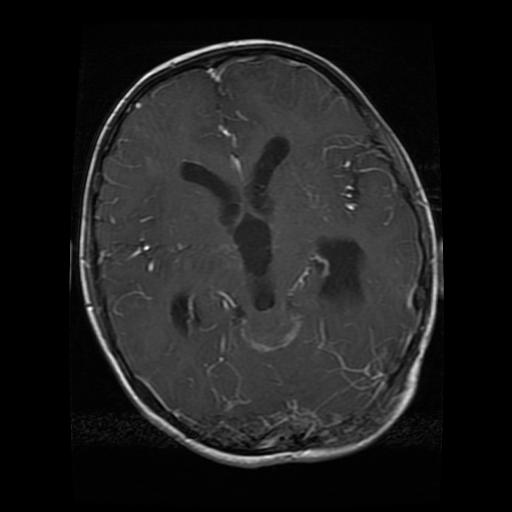

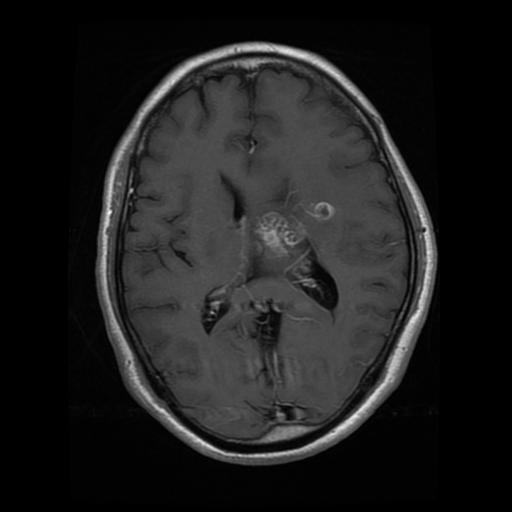


Kategori: meningioma


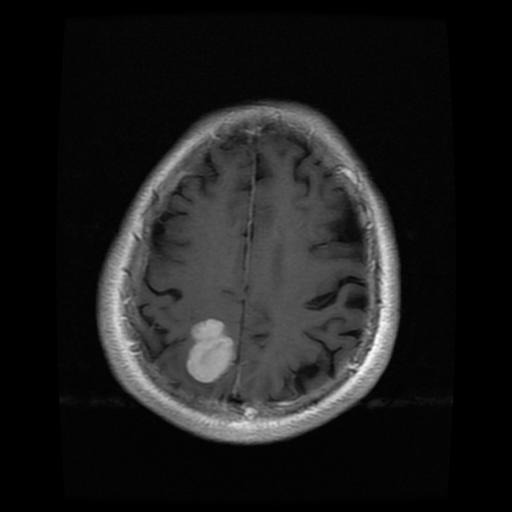

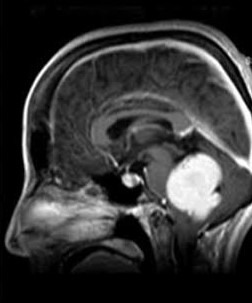

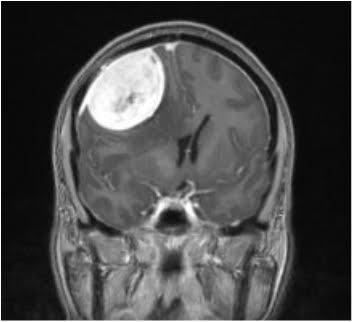

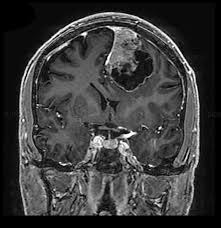

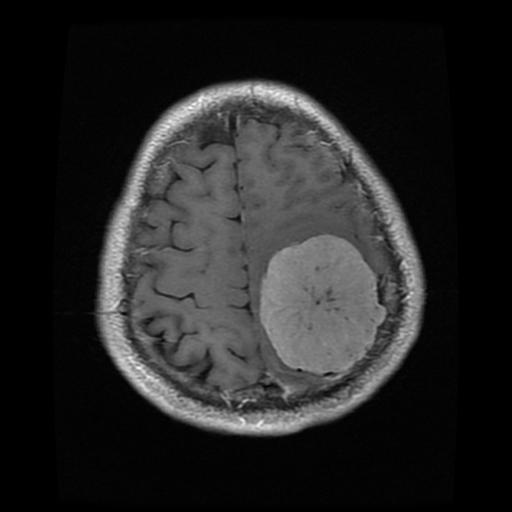


Kategori: notumor


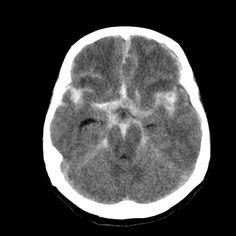

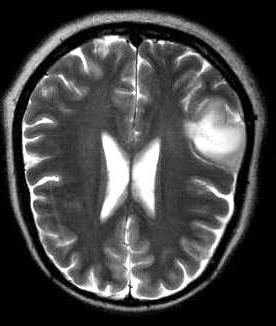

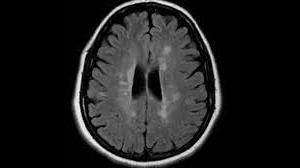

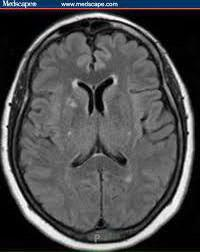

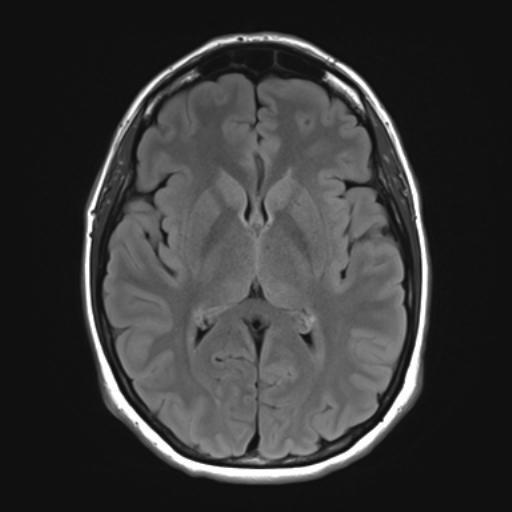


Kategori: pituitary


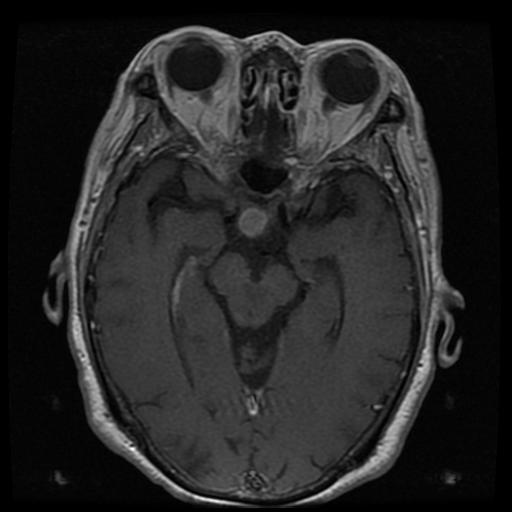

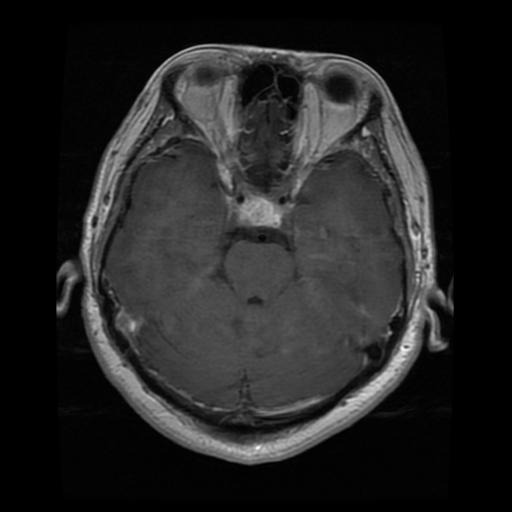

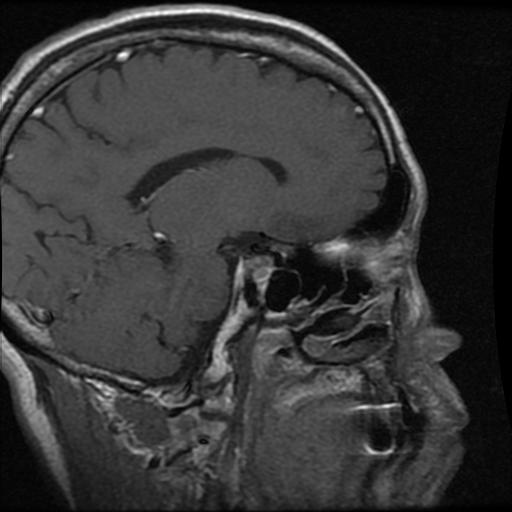

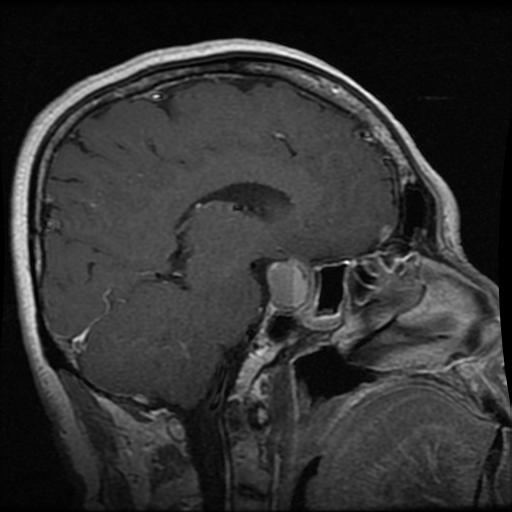

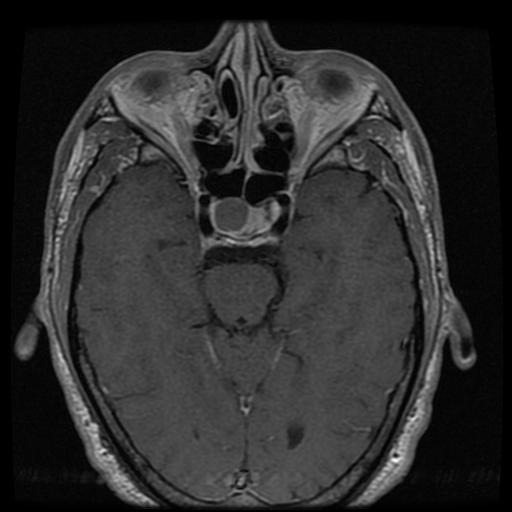

In [11]:
print("Contoh variasi visual dari masing-masing kategori pada Testing Dataset:")

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    for label in list(testing_by_class.keys())[:4]:  
        print(f"\nKategori: {label}")
        samples = random.sample(testing_by_class[label], 5)  

        for file_name in samples:
            with zip_ref.open(file_name) as file:
                img = Image.open(io.BytesIO(file.read()))
                display(img)

Hasil di atas menunjukkan sampel variasi random dari dataset training dan testing, dimana variasi nya meliputi lighting, angle dan occlusions.

In [14]:
train_dir = r"C:\Users\idan0\Downloads\02-20250409T170740Z-001\02\Dataset 2A\Training"
test_dir = r"C:\Users\idan0\Downloads\02-20250409T170740Z-001\02\Dataset 2A\Testing"

train_datagen = ImageDataGenerator(
    rescale=1./255, 
    shear_range=0.2, 
    zoom_range=0.2,   
    horizontal_flip=True,  
    validation_split=0.15 
)

valid_datagen = ImageDataGenerator(rescale=1./255) 


train_data = train_datagen.flow_from_directory(
    train_dir,
    batch_size=32,
    target_size=(224, 224), 
    class_mode="categorical",  
    shuffle=True,
    subset='training',  
    seed=42
)


valid_data = train_datagen.flow_from_directory(
    train_dir,
    batch_size=32,
    target_size=(224, 224),
    class_mode="categorical",
    shuffle=True,
    subset='validation',  
    seed=42
)

test_data = valid_datagen.flow_from_directory(
    test_dir,
    batch_size=32,
    target_size=(224, 224),
    class_mode="categorical", 
    shuffle=False, 
    seed=42
)




Found 4857 images belonging to 4 classes.
Found 855 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


training di split untuk validation sebesar 15%. sehinggan proporsinya 85 : 15
Kemudian train, test, dan validasi data di resize ke (224, 224)

### Nomor 2B

Membangun model Alex_net dengan 12 layer. Kemudian untuk metriknya menggunakan accuracy.

In [16]:
def alexnet_model(input_shape=(224, 224, 3), num_classes=4):

    model = models.Sequential()
    

    model.add(layers.Conv2D(96, (11, 11), strides=(4,4), activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D((3, 3), strides=(2,2)))

    model.add(layers.Conv2D(256, (5, 5), padding='same', activation='relu'))
    model.add(layers.MaxPooling2D((3, 3), strides=(2,2)))
    
    model.add(layers.Conv2D(384, (3, 3), padding='same', activation='relu'))
    
    model.add(layers.Conv2D(384, (3, 3), padding='same', activation='relu'))

    model.add(layers.Conv2D(256, (3, 3), padding='same', activation='relu'))
    model.add(layers.MaxPooling2D((3, 3), strides=(2,2)))

    model.add(layers.Flatten())

    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dropout(0.5))
    
    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dropout(0.5))
    
    model.add(layers.Dense(num_classes, activation='softmax'))
    
    model.compile(optimizer=optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

    
    return model

In [17]:
model_an = alexnet_model(input_shape=(224, 224, 3), num_classes=4)
model_an.summary()

history_an = model_an.fit(
    train_data,
    validation_data=valid_data,
    epochs=15
)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 54, 54, 96)          │          34,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 26, 26, 96)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 26, 26, 256)         │         614,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 12, 12, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 12, 12, 384)         │         885,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 12, 12, 384)         │       1,327,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 12, 12, 256)         │         884,992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 5, 5, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 6400)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 4096)                │      26,218,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4096)                │      16,781,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 4)                   │          16,388 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 46,763,396 (178.39 MB)

 Trainable params: 46,763,396 (178.39 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 137s 888ms/step - accuracy: 0.3464 - loss: 1.2855 - val_accuracy: 0.5953 - val_loss: 1.0266
Epoch 2/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 131s 860ms/step - accuracy: 0.6632 - loss: 0.7730 - val_accuracy: 0.7076 - val_loss: 0.7787
Epoch 3/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 130s 855ms/step - accuracy: 0.7465 - loss: 0.6131 - val_accuracy: 0.6772 - val_loss: 0.8448
Epoch 4/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 124s 819ms/step - accuracy: 0.8386 - loss: 0.4399 - val_accuracy: 0.6760 - val_loss: 0.7960
Epoch 5/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 114s 748ms/step - accuracy: 0.8551 - loss: 0.3796 - val_accuracy: 0.7743 - val_loss: 0.6230
Epoch 6/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 114s 746ms/step - accuracy: 0.8861 - loss: 0.2994 - val_accuracy: 0.8608 - val_loss: 0.4390
Epoch 7/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 114s 750ms/step - accuracy: 0.9030 - loss: 0.2577 - val_accuracy: 0.8257 - val_loss: 0.4730
Epoch 8/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 117s 768ms/step - accuracy: 0.9280 -

Dari hasil epoch AlexNet model ini, diketahui bahwa model mampu belajar dengan baik dan tidak ada overfitting. Hasil akurasi training juga tinggi yaitu 96.8% dan akurasi validasi 93.1%, dengan val loss yang rendah.

## Nomor 2C

Modifikasi AlexNet model dengan menambahkan Batch Normalization dan jumlah layer 24, serta earlystop jika terjadi overfitting.

In [18]:
def modified_alexnet(input_shape=(224, 224, 3), num_classes=4, learning_rate=0.0001):
    model = models.Sequential()

    model.add(layers.Conv2D(96, (11, 11), strides=4, padding='same', input_shape=input_shape))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((3, 3), strides=2))

    model.add(layers.Conv2D(256, (5, 5), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((3, 3), strides=2))

    model.add(layers.Conv2D(384, (3, 3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(384, (3, 3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(256, (3, 3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((3, 3), strides=2))

    model.add(layers.Flatten())

    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(num_classes, activation='softmax'))

    optimizer = optimizers.Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model


In [19]:
batch_size = 32
epochs = 15

model_an_mod = modified_alexnet(learning_rate=learning_rate)

early_stop = EarlyStopping(monitor='val_loss', patience=3)

history_an_mod = model.fit(
    train_data,
    epochs=epochs,
    validation_data=valid_data,
    batch_size=batch_size,
    callbacks=[early_stop]
)


Epoch 1/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 146s 948ms/step - accuracy: 0.5159 - loss: 2.0702 - val_accuracy: 0.2316 - val_loss: 1.6568
Epoch 2/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 144s 947ms/step - accuracy: 0.6928 - loss: 0.8367 - val_accuracy: 0.2421 - val_loss: 2.7919
Epoch 3/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 147s 968ms/step - accuracy: 0.7737 - loss: 0.6298 - val_accuracy: 0.4503 - val_loss: 1.9150
Epoch 4/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 142s 934ms/step - accuracy: 0.7984 - loss: 0.5552 - val_accuracy: 0.4257 - val_loss: 1.8362


Untuk AlexNet Model modified ini terindikasi overfitting jadi berhenti di epoch 4. Dari hasil epoch ini, diketahui bahwa model bagus di training tapi kurang cukup baik di validasi.

Coba dengan DenseNet model, kemudian saya menggunakan dua learning rate, yaitu 0.0005 dan 0.0001 untuk melihat di learning rate berapa DenseNet model mampu bekerja lebih baik.

In [21]:
def densenet_model(input_shape=(224, 224, 3), num_classes=4, learning_rate=0.0001):
    base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False

    model = models.Sequential()
    model.add(base_model)

    model.add(layers.Conv2D(512, (3, 3), padding='same', activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2), strides=2))

    model.add(layers.Conv2D(512, (3, 3), padding='same', activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2), strides=2))

    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.5))

    model.add(layers.Flatten())
    model.add(layers.Dense(2048, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(1024, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(num_classes, activation='softmax'))

    optimizer = optimizers.Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model


batch_size = 32
epochs = 15
learning_rates = [0.0005, 0.0001]

results = []

for lr in learning_rates:
    print(f"\nTraining model with learning rate = {lr}")
    model_dn = densenet_model(input_shape=(224, 224, 3), num_classes=4, learning_rate=lr)
    model_dn.summary()
    
    early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

    history = model_dn.fit(
        train_data,
        epochs=epochs,
        validation_data=valid_data,
        batch_size=batch_size,
        callbacks=[early_stop],
        verbose=1
    )

    final_train_acc = history.history['accuracy'][-1]
    final_val_acc = history.history['val_accuracy'][-1]
    final_train_loss = history.history['loss'][-1]
    final_val_loss = history.history['val_loss'][-1]

    results.append({
        'Learning Rate': lr,
        'Train Accuracy': final_train_acc,
        'Validation Accuracy': final_val_acc,
        'Train Loss': final_train_loss,
        'Validation Loss': final_val_loss
    })

df_results = pd.DataFrame(results)
print(df_results.sort_values(by='Validation Accuracy', ascending=False).round(4))



Training model with learning rate = 0.0005


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)             │ (None, 7, 7, 1024)          │       7,037,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 7, 7, 512)           │       4,719,104 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 7, 7, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 3, 3, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 3, 3, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 3, 3, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 1, 1, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 1, 1, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 1, 1, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 2048)                │       1,050,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1024)                │       2,098,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 4)                   │           4,100 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,275,460 (65.90 MB)

 Trainable params: 10,234,884 (39.04 MB)

 Non-trainable params: 7,040,576 (26.86 MB)

Epoch 1/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 196s 1s/step - accuracy: 0.7275 - loss: 0.8254 - val_accuracy: 0.7146 - val_loss: 1.0488
Epoch 2/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 190s 1s/step - accuracy: 0.8843 - loss: 0.3514 - val_accuracy: 0.8374 - val_loss: 0.4441
Epoch 3/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 203s 1s/step - accuracy: 0.9053 - loss: 0.2805 - val_accuracy: 0.8246 - val_loss: 0.6441
Epoch 4/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 228s 2s/step - accuracy: 0.9237 - loss: 0.2097 - val_accuracy: 0.8620 - val_loss: 0.3794
Epoch 5/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 228s 1s/step - accuracy: 0.9266 - loss: 0.1992 - val_accuracy: 0.8152 - val_loss: 0.6324
Epoch 6/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 228s 1s/step - accuracy: 0.9346 - loss: 0.1926 - val_accuracy: 0.8620 - val_loss: 0.4678
Epoch 7/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 222s 1s/step - accuracy: 0.9282 - loss: 0.1907 - val_accuracy: 0.8632 - val_loss: 0.4220

Training model with learning rate = 0.0001


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)             │ (None, 7, 7, 1024)          │       7,037,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 7, 7, 512)           │       4,719,104 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 7, 7, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 3, 3, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 3, 3, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 3, 3, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 1, 1, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 1, 1, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 1, 1, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 2048)                │       1,050,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 1024)                │       2,098,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 4)                   │           4,100 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,275,460 (65.90 MB)

 Trainable params: 10,234,884 (39.04 MB)

 Non-trainable params: 7,040,576 (26.86 MB)

Epoch 1/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 216s 1s/step - accuracy: 0.6456 - loss: 0.9267 - val_accuracy: 0.7731 - val_loss: 0.6343
Epoch 2/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 199s 1s/step - accuracy: 0.8653 - loss: 0.3898 - val_accuracy: 0.8632 - val_loss: 0.3659
Epoch 3/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 227s 1s/step - accuracy: 0.8946 - loss: 0.2977 - val_accuracy: 0.8573 - val_loss: 0.4223
Epoch 4/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 207s 1s/step - accuracy: 0.9058 - loss: 0.2554 - val_accuracy: 0.8737 - val_loss: 0.3665
Epoch 5/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 198s 1s/step - accuracy: 0.9059 - loss: 0.2601 - val_accuracy: 0.8865 - val_loss: 0.3047
Epoch 6/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 211s 1s/step - accuracy: 0.9276 - loss: 0.2083 - val_accuracy: 0.9088 - val_loss: 0.2693
Epoch 7/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 198s 1s/step - accuracy: 0.9345 - loss: 0.1828 - val_accuracy: 0.8456 - val_loss: 0.4910
Epoch 8/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 192s 1s/step - accuracy: 0.9407 - loss: 0.1545 - val_accu

Hasil dari kedua learning rate terhadap DenseNet model :
- Model bekerja lebih baik dengan learning rate yang lebih kecil yaitu 0.0001. Bisa dilihat dari train accuracy dan validation accrucay yang lebih tinggi.
- Train loss dan val loss dari learning rate 0.0001 juga lebih rendah yang artinya dapat mengurangi kesalahan selama pelatihan.
- Keduanya terindikasi overfitting, tapi learning rate 0.0001 mampu menghasilkan performa yang lebih baik.

Train ulang dengan learning rate 0.0001

In [24]:
model_dn_best = densenet_model(input_shape=(224, 224, 3), num_classes=4, learning_rate=0.0001)

early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history_best = model_dn_best.fit(
    train_data,
    epochs=epochs,
    validation_data=valid_data,
    batch_size=batch_size,
    callbacks=[early_stop],
    verbose=1
)

Epoch 1/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 215s 1s/step - accuracy: 0.6506 - loss: 0.8903 - val_accuracy: 0.7567 - val_loss: 0.6338
Epoch 2/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 214s 1s/step - accuracy: 0.8691 - loss: 0.3708 - val_accuracy: 0.8398 - val_loss: 0.4385
Epoch 3/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 201s 1s/step - accuracy: 0.8869 - loss: 0.3070 - val_accuracy: 0.8667 - val_loss: 0.3477
Epoch 4/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 217s 1s/step - accuracy: 0.9109 - loss: 0.2376 - val_accuracy: 0.8784 - val_loss: 0.3493
Epoch 5/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 211s 1s/step - accuracy: 0.9081 - loss: 0.2434 - val_accuracy: 0.8901 - val_loss: 0.3319
Epoch 6/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 220s 1s/step - accuracy: 0.9364 - loss: 0.1804 - val_accuracy: 0.8901 - val_loss: 0.3199
Epoch 7/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 213s 1s/step - accuracy: 0.9313 - loss: 0.1914 - val_accuracy: 0.9041 - val_loss: 0.2884
Epoch 8/15
152/152 ━━━━━━━━━━━━━━━━━━━━ 211s 1s/step - accuracy: 0.9469 - loss: 0.1461 - val_accu

### Nomor 2D

41/41 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step
41/41 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step 

Perbandingan Hasil Evaluasi:
      Metric  Model 1 (AlexNet)  Model 2 (DenseNet)
0   Accuracy             0.9451              0.9474
1  Precision             0.9480              0.9448
2     Recall             0.9411              0.9442
3   F1-Score             0.9436              0.9444


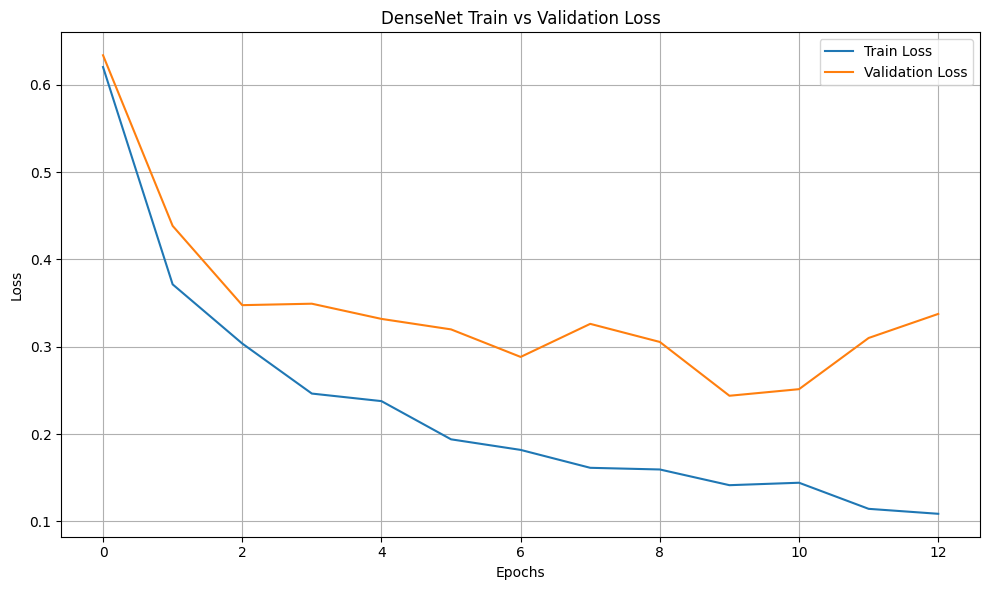

In [26]:
y_pred_an = np.argmax(model_an.predict(test_data), axis=1)
y_true = test_data.classes

acc_an = accuracy_score(y_true, y_pred_an)
prec_an = precision_score(y_true, y_pred_an, average='macro')
rec_an = recall_score(y_true, y_pred_an, average='macro')
f1_an = f1_score(y_true, y_pred_an, average='macro')

y_pred_dn = np.argmax(model_dn_best.predict(test_data), axis=1)

acc_dn = accuracy_score(y_true, y_pred_dn)
prec_dn = precision_score(y_true, y_pred_dn, average='macro')
rec_dn = recall_score(y_true, y_pred_dn, average='macro')
f1_dn = f1_score(y_true, y_pred_dn, average='macro')

df_compare = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
    'Model 1 (AlexNet)': [acc_an, prec_an, rec_an, f1_an],
    'Model 2 (DenseNet)': [acc_dn, prec_dn, rec_dn, f1_dn]
})

print("\nPerbandingan Hasil Evaluasi:")
print(df_compare.round(4))

plt.figure(figsize=(10, 6))
plt.plot(history_best.history['loss'], label='Train Loss')
plt.plot(history_best.history['val_loss'], label='Validation Loss')
plt.title('DenseNet Train vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

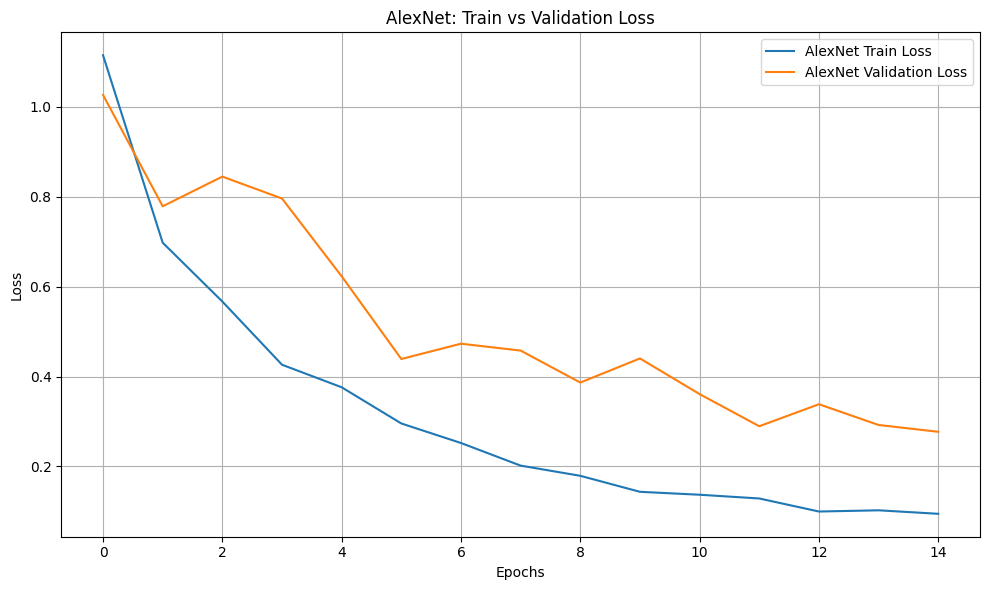

In [27]:
plt.figure(figsize=(10, 6))
plt.plot(history_an.history['loss'], label='AlexNet Train Loss')
plt.plot(history_an.history['val_loss'], label='AlexNet Validation Loss')
plt.title('AlexNet: Train vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Dari hasil evaluasi, diketahui:
- Accuracy = DenseNet sedikit lebih baik dari AlexNet, artinya DenseNet lebih akurat dalam klasifikasi.
- Precision = AlexNet sedikit lebih baik dari DenseNet, artinya AlexNet lebih hati-hati dalam memberikan prediksi positif
- Recall = DenseNet unggul dari AlexNet, berarti DenseNet lebih baik dalam mendeteksi data positif yang sebenarnya.
- F1-Score = DenseNet unggul dari AlexNet, berarti DenseNet lebih baik dalam menyeimbangkan antara precision dan recall.

Kesimpulannya : DenseNet lebih baik dari AlexNet meskipun perbedaanya sedikit.

### Nomor 2e

Link Video : https://drive.google.com/file/d/1XeDR1E0dcI5BrbYdU4hCyOShV1ouy5ax/view?usp=sharing